## Import Packages

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
#importing some useful packages
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
try:
    from cv2 import cv2
except:
    import cv2
import math
%matplotlib inline


In [8]:
import CamCal
import importlib
importlib.reload(CamCal)

<module 'CamCal' from '/home/ishu/Documents/my-work/DrivingNdd/src/projects/advancedLanes/CarND-Advanced-Lane-Lines/CamCal.py'>

The goal of this project is to find lane lines with the help of a video stream from a dashcam on the front of a car,
 and produce identified lane lines and radius of curvature,. The output is overlayed on the original image :
- The positions of the lane lines 
- The radius of curvature of the road

The processing steps for images include :
1. Camera Calibration and Distortion correction.
2. Color thresholding to identify lane pixel in the image 
3. Warping image with perspective transformation to get birds eye view of the lane lines. 
4. Among all identified pixels find lane line pixels
5. Fit a line in both left lane line and right lane line 
6: Unwarp the detected lane line and superimpose it one original image.
7: Process video frames with queue of size N

## Camera Caliberation

Often camera have some sort of distortion in the output images, these distortion must be removed before processing.
1. Capture chessboard images from the camera, from multiple angles
2. In these chess images find corner using `opencv- cv2.findChessboardCorners`. These corner are helpful for the 
algorithm to find lines and remove distortion effects.
3. Using these corner points user opencv function `calibrateCamera` to compute distortion coefficient and calibration matrix
4. Save <i>distortion coefficent</i> and <i>distortion matrix</i> to distort all images.
5. Distortion is specially visible around the edges and corner of image.  

Code implemented in file CamCal.py


In [9]:
caliberation_data = CamCal.caliberate()
print(caliberation_data['mtx'])
print(caliberation_data['dist'])

data saved to pickle file: ./camera_cal/caliberation_data.pkl
[[1.15777829e+03 0.00000000e+00 6.67113866e+02]
 [0.00000000e+00 1.15282230e+03 3.86124658e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[-0.24688572 -0.02372825 -0.00109832  0.00035104 -0.00260432]]


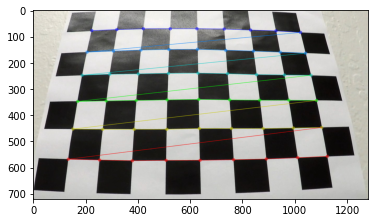

In [10]:
dist_images = [[im, plt.imread(im)] for im  in CamCal.get_images_path_list(image_folder='./camera_cal')]
draw = CamCal.draw_corners(dist_images[10][1], nx = 9, ny = 6)

In [11]:
caliberated_images = [(im[0], CamCal.caliberate_from_pickle(im[1])) for im in dist_images[:]]

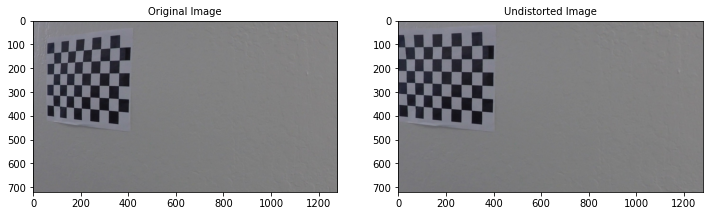

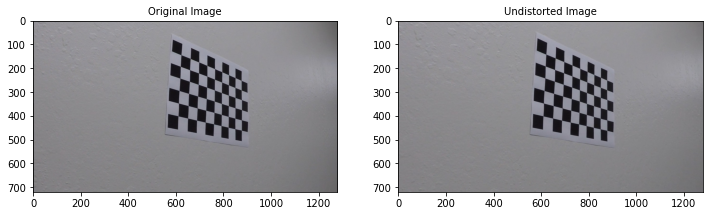

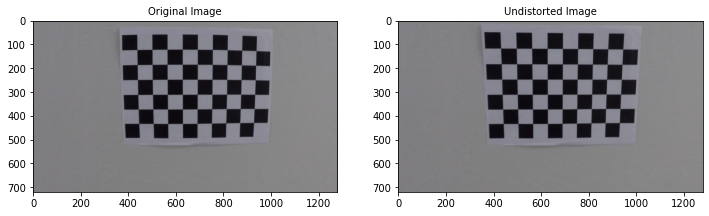

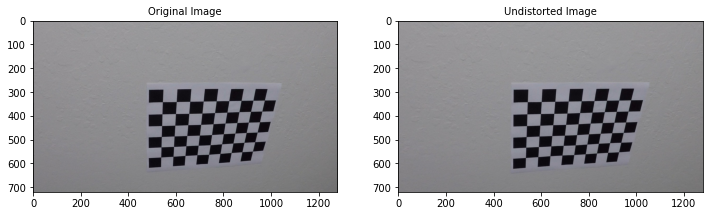

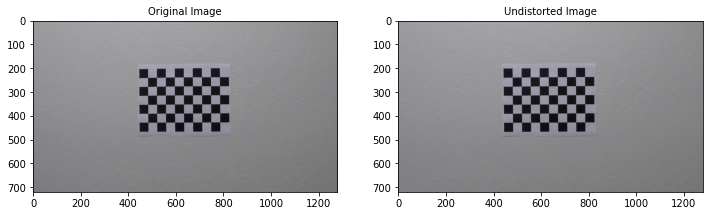

...

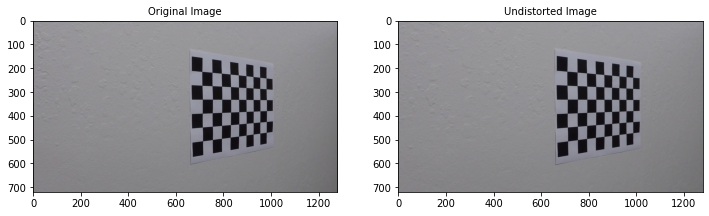

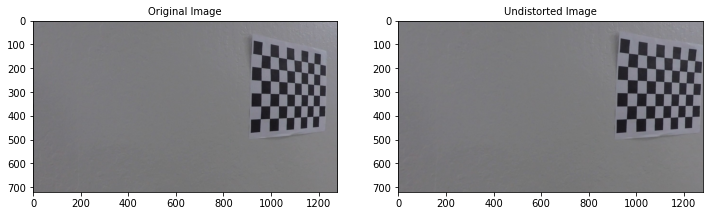

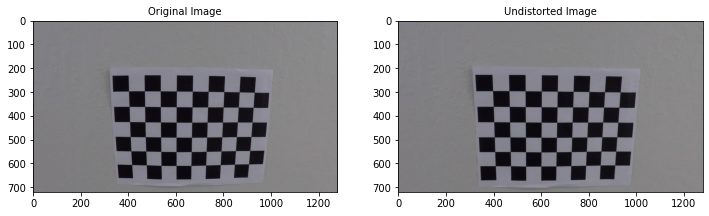

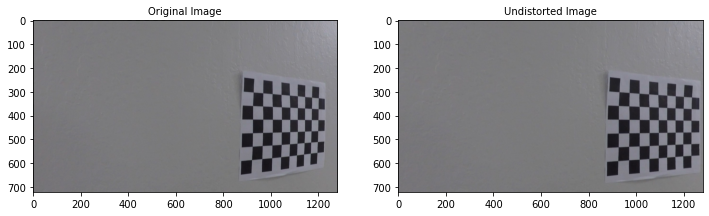

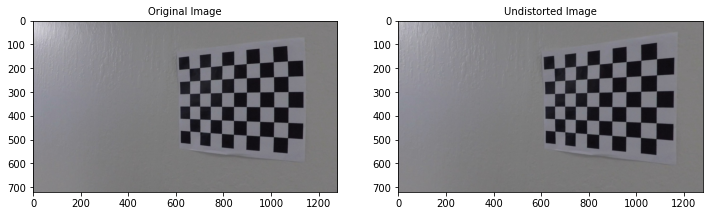

In [12]:
for i in range(len(caliberated_images)):
    CamCal.disp_compare_img(dist_images[i][1], caliberated_images[i][1], index=i)

## Image Processing Functions

### Step 2: Color Thresholding.
This Step involves converting color images to binary pixel image where pixel value of 1 is pixel of interest and can
 potential lane lines. Image is converted to several color spaces like HSV and HLS for specific parts.
 1. Convert RGB image to HLS and HSV color space.
    1. Extract L and S channel from HLS, Compute gradients on L and S Channel and binarize binarize if pixel value is between threshold
    2. Compute Gradients of R Channel as it sensitive to yellow and binarize if pixel value is between threshold
    3. Create Color mask of yellow and white thresholding on HSV space and identify area which have white or yellow pixels.
2. Gradients on raw pixel is noisy, so use median blur to remove noise, this removes salt and pepper noise from images.
3. Use box filter to enlarge area around pixel points.
4. A logical and is computed between all the gradient processed image
5. Apply color mask to computed gradient image to achieve final binary image.

In [13]:
import ProcessImage
import ProcessingPipeline
import importlib
importlib.reload(ProcessImage)
importlib.reload(ProcessingPipeline)


<module 'ProcessingPipeline' from '/home/ishu/Documents/my-work/DrivingNdd/src/projects/advancedLanes/CarND-Advanced-Lane-Lines/ProcessingPipeline.py'>

In [14]:
proc = ProcessingPipeline.ProcessingPipeline()

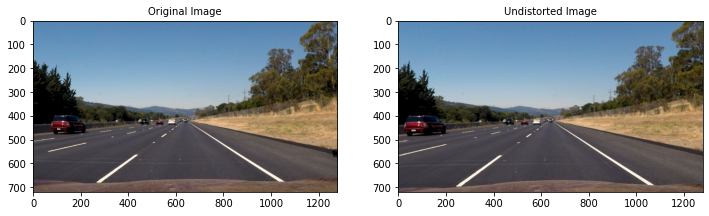

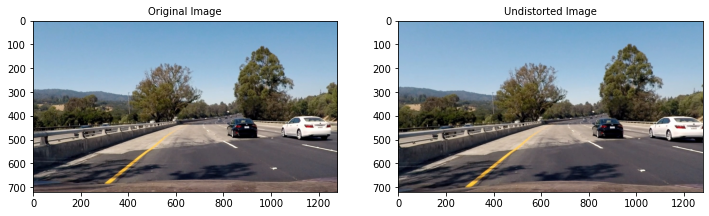

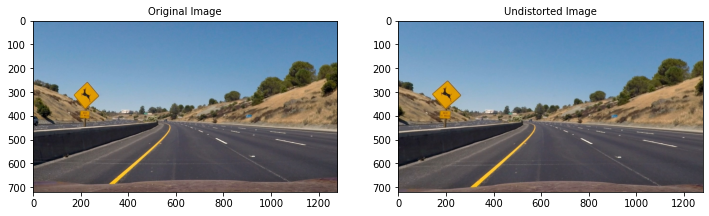

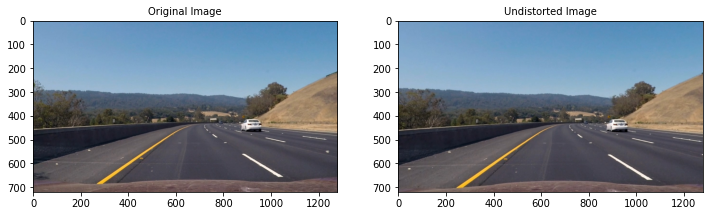

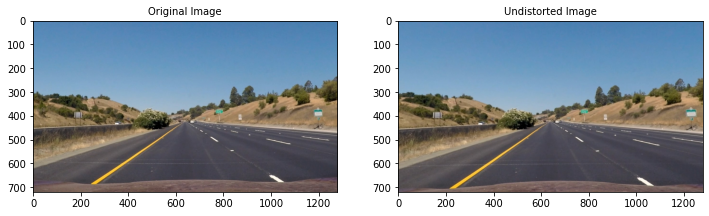

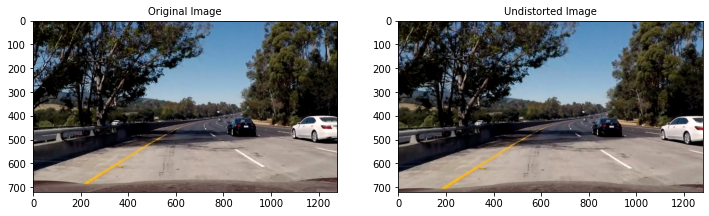

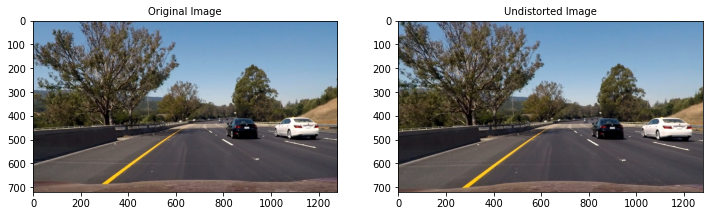

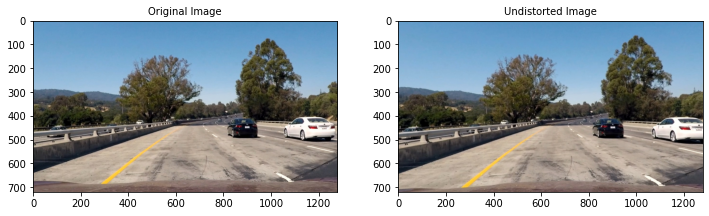

In [15]:
test_imgs_raw = [[im, plt.imread(im)] for im  in CamCal.get_images_path_list(image_folder='./test_images')]
test_imgs = [[im[0], CamCal.caliberate_from_pickle(im[1], disp=True)] for im in test_imgs_raw]


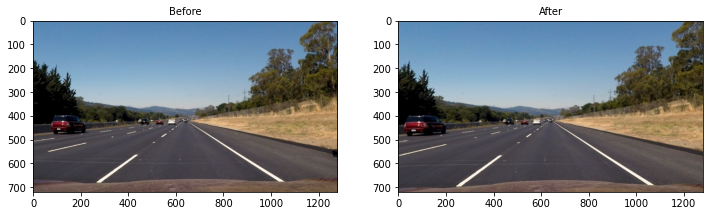

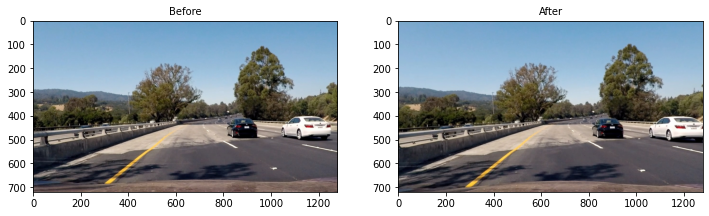

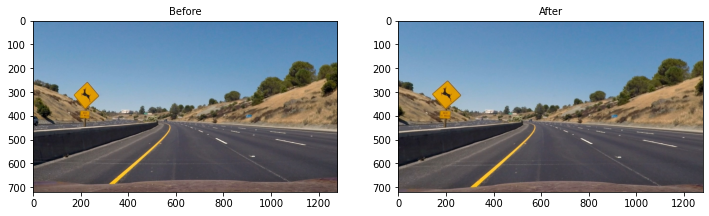

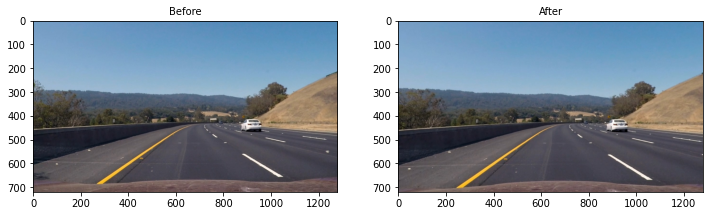

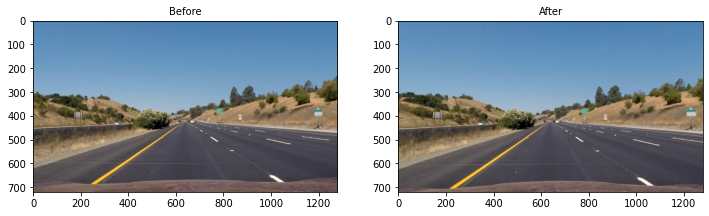

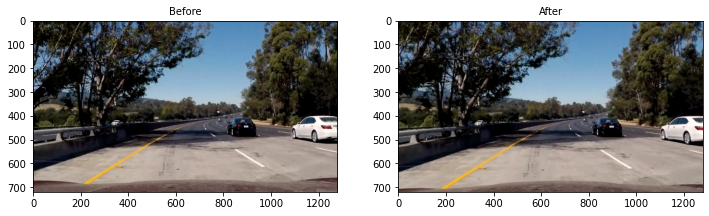

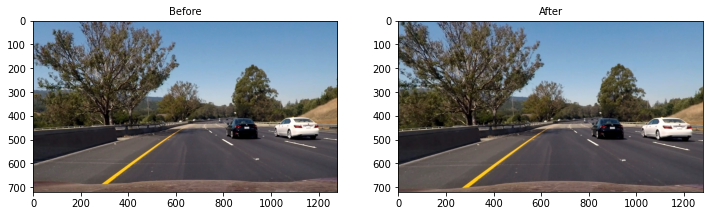

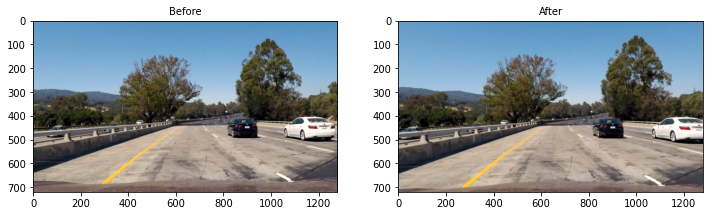

In [16]:
for i in range(len(test_imgs)):
    i1 = test_imgs_raw[i][1]
    i2 = test_imgs[i][1]
    proc.plot_side_by_side(i1,i2, save=True, fpath='output_images/Step1_img_undist',num=i)

In [17]:
img = test_imgs[0][1]
imgProcessor = ProcessImage.ProcessImage()
processed_imgs = [[im[0],imgProcessor.pipeline(im[1])] for im in test_imgs]

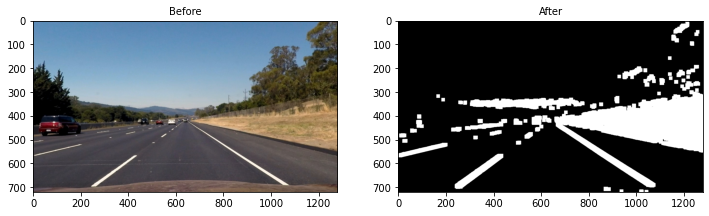

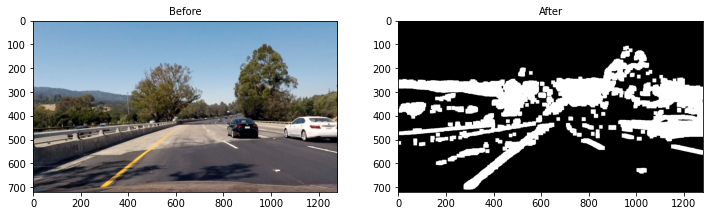

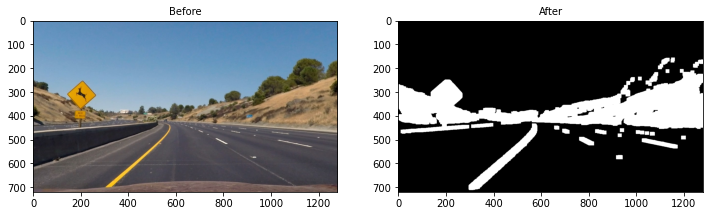

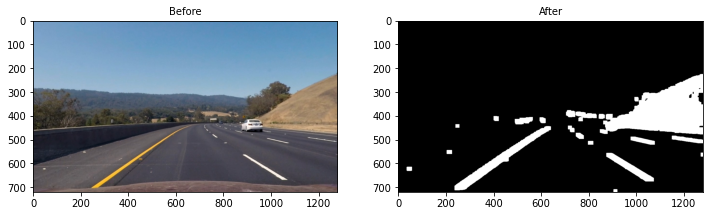

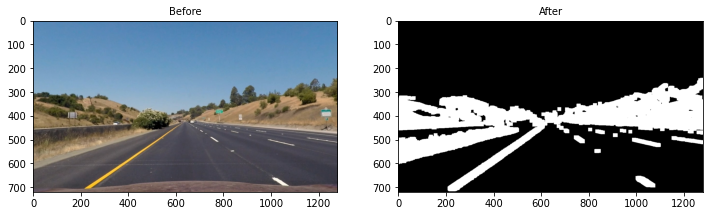

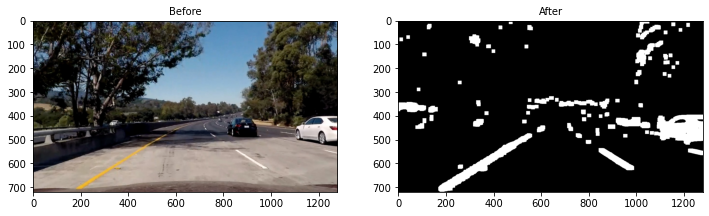

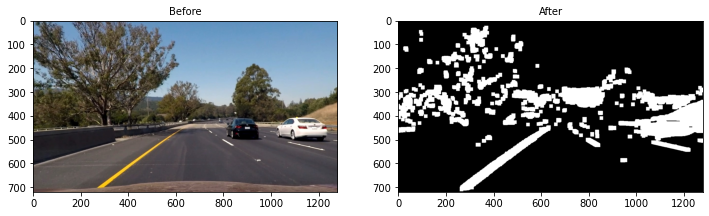

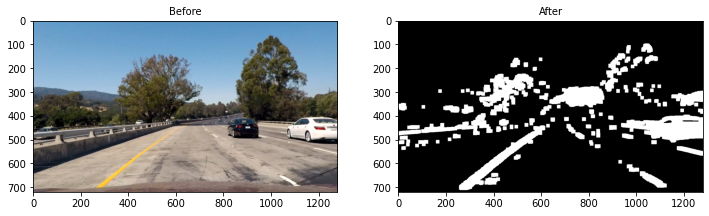

In [18]:
for i in range(len(processed_imgs)):
    i1 = test_imgs[i][1]
    i2 = processed_imgs[i][1]
    proc.plot_side_by_side(i1,i2, save=True, fpath='output_images/step2',num=i)

### Step 3: Perspective Transformation.
This steps transform our area of interest which is polygon around which we expect lane lines to be, usually lower half of the image.
1. Extract 4 points around region of interest convert it into a top down view, also called birds eye view.
2. Using these points warp the image such that the lane lines appear to be parallel to each other.
3. OpenCV functions `getPerspectiveTransform` and `warpPerspective` to warp the images and save the transformation matrix
 

In [19]:
warped_images = [[im[0], proc.get_birds_eye(im[1], display=False)] for im in test_imgs]

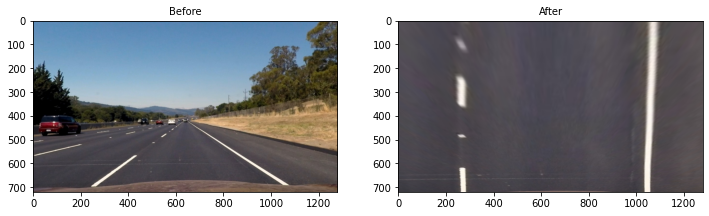

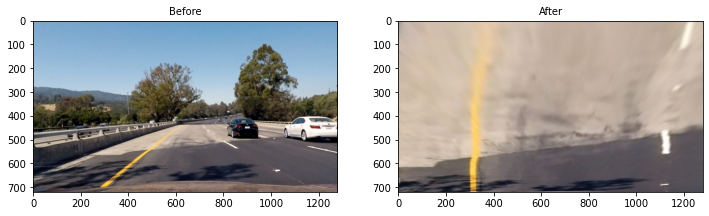

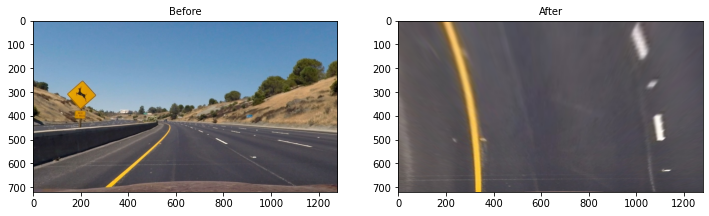

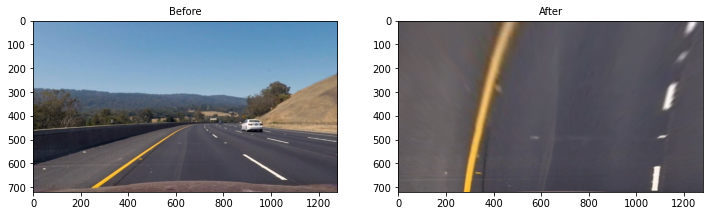

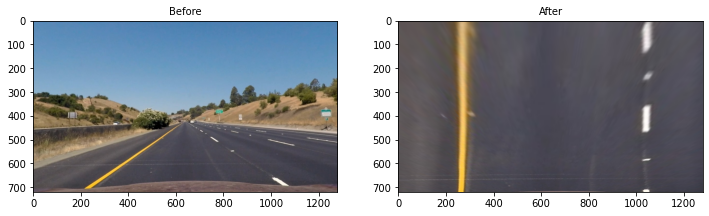

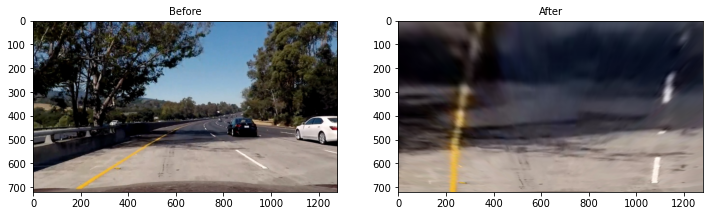

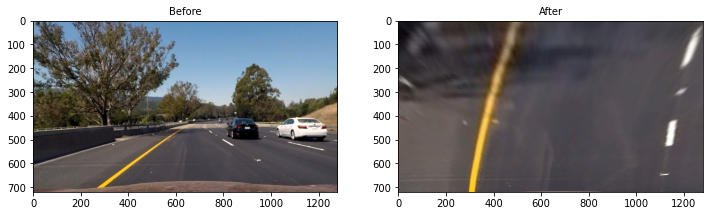

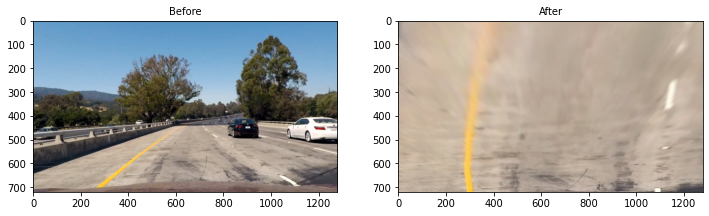

In [20]:
for i in range(len(warped_images)):
    i1 = test_imgs[i][1]
    i2 = warped_images[i][1]
    proc.plot_side_by_side(i1,i2, save=True, fpath='output_images/step3',num=i)

### Step 4: Applying Binary Thresholds
Instead of applying threshold to the complete image, allpying threshold to warped bird eye view of lanes lines makes more sense
Thus I apply thresholding to just warped images and obtain activated pixels for the lane lines

In [21]:
warped_processed = [[im[0],imgProcessor.pipeline(im[1])] for im in warped_images]

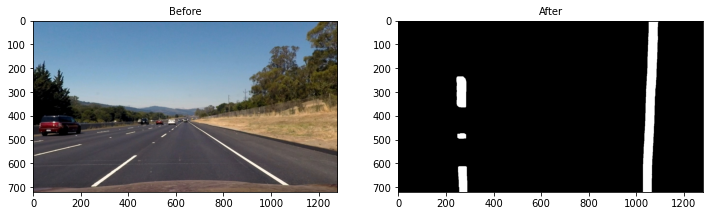

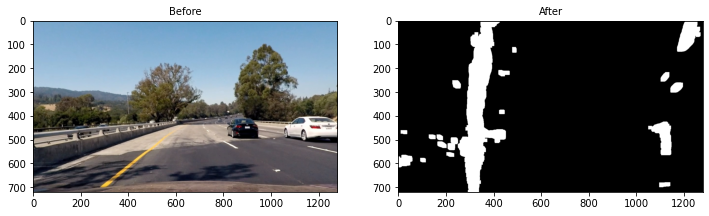

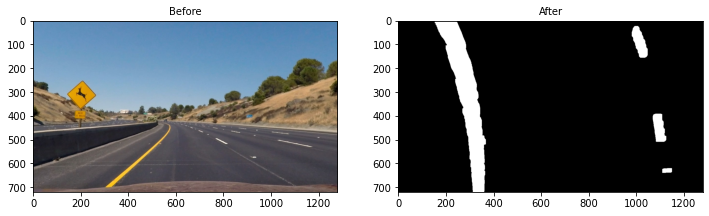

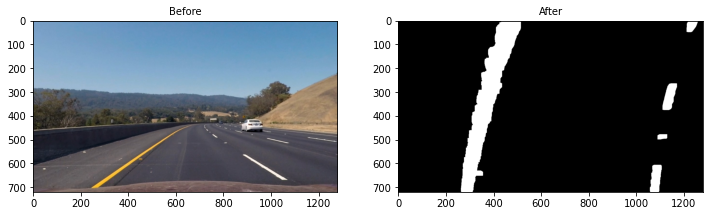

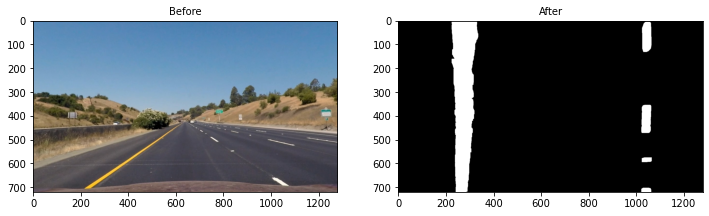

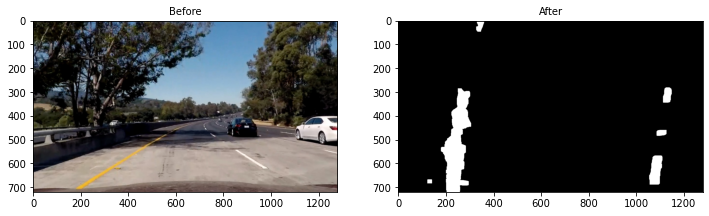

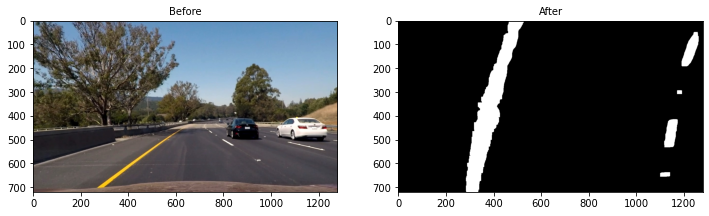

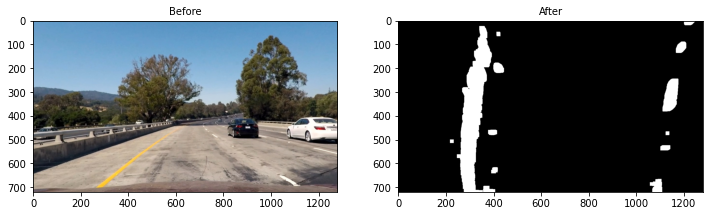

In [22]:
for i in range(len(warped_processed)):
    i1 = test_imgs[i][1]
    i2 = warped_processed[i][1]
    proc.plot_side_by_side(i1,i2, save=True, fpath='output_images/step3',num=i)

### Step 5: Fitting lines to activated pixels 
Usually binarized image of birds eye view have two major activation peaks along the X axis,
around position of left and right lane. Goal os this step is to start with the base of image 
and find activated pixel using sliding window from bottom of the image to top 

1. Find the histogram of activated pixel along X axis, usually it is an bimodal distribution 
depicting left and right lane lines
2. Left peak usually is the starting x point of left lane, right peak is for right lane.
3. Search space in image is optimized using search around histogram peaks in x axis and searching 
in N window across Y-Axis 
3. For the first window Starting from the index of the peak we search around the a window of N pixels around the 
central point to find other activated pixels add them to tracking list,
4. I shift the window center based in the number of points and their mean so as to approximate 
points center near actual means.
5. Cover all image using N window to find all activated pixel points.
6. Using these pixel points as training data, I train a 2nd order regression model to fit Y axis
to X axis. With the help of model parameters, compute the best fit line across these activated points
7. Two Line objects are created for lane points are added to best fit is computed. Refer method `Lines.add_points(...)` 
for detailed fitting of lines
8. Radius of curvature was calculated and converted to metric system using `Line.calc_radius(...)` method
10. Center point is calculated in the `ProcessingPipeline.process(...)`

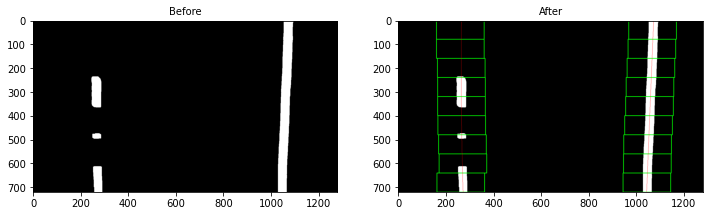

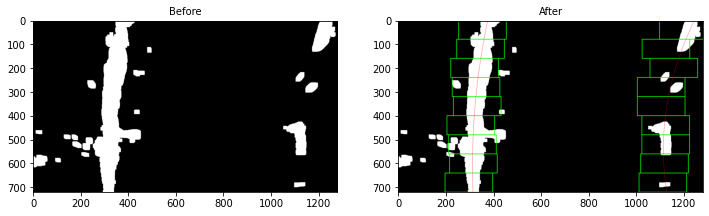

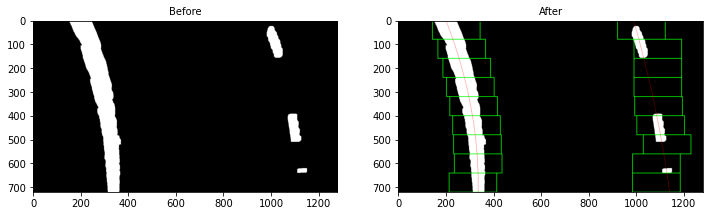

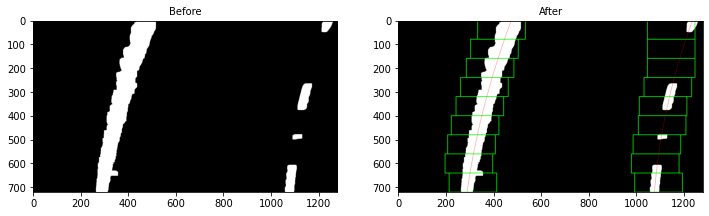

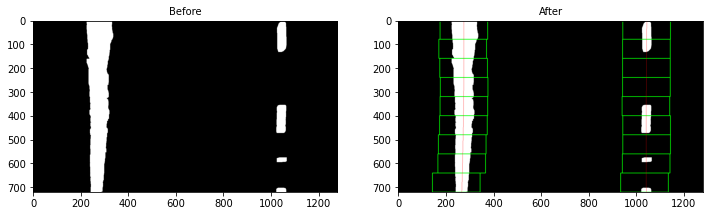

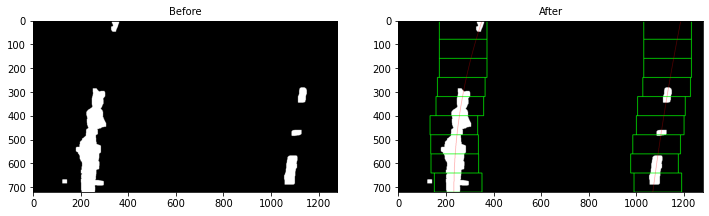

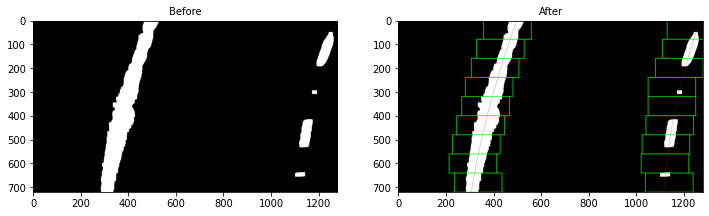

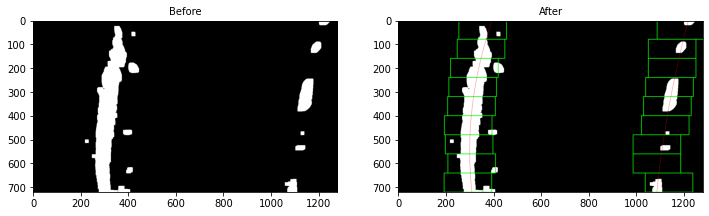

In [23]:
for i in range(len(warped_processed)):
    img = warped_processed[i][1]
    proc = ProcessingPipeline.ProcessingPipeline()
    left_x, left_y, right_x, right_y, out_img = proc.find_lane_pixel_window(img)
    x_left_fitted, y_left_fitted = proc.left_line.add_points(left_x, left_y)
    x_right_fitted, y_right_fitted = proc.right_line.add_points(right_x, right_y)
    out_img[y_left_fitted, x_left_fitted] = (255, 0, 0)
    out_img[y_right_fitted, x_right_fitted] = (255, 0, 0)
    proc.plot_side_by_side(img,out_img, save=True, fpath='output_images/step5',num=i)
    

### Testing Images

### Step 6: Putting it all together
After finding the lane line from the step 5, we can unwarp using reverse perspective transform 
the line pixel position to actual image pixel position
1. Inverse perspective transformation to get line pixel location in unwarped images.
2. Over lay this line and fill space between the to indicate lane markings. 
3. Over lay radius of curvature and center point on the image


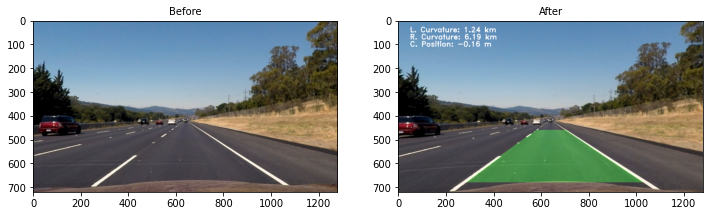

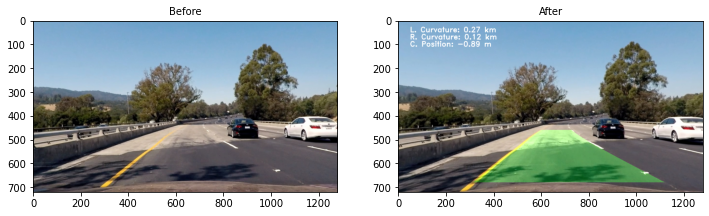

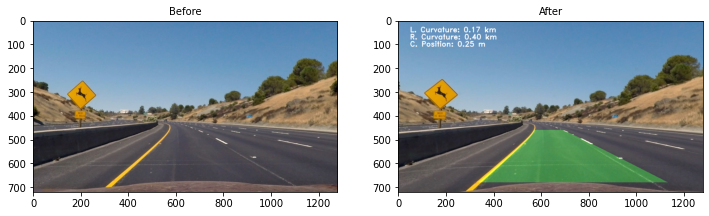

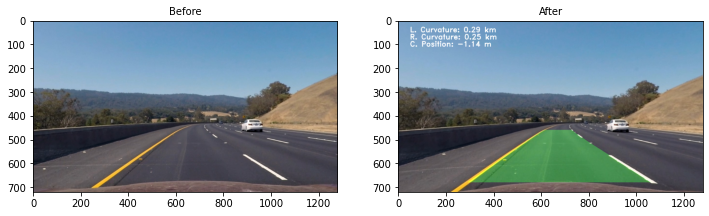

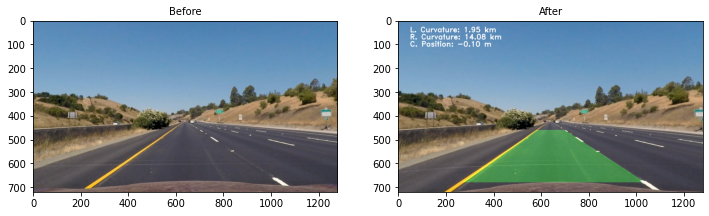

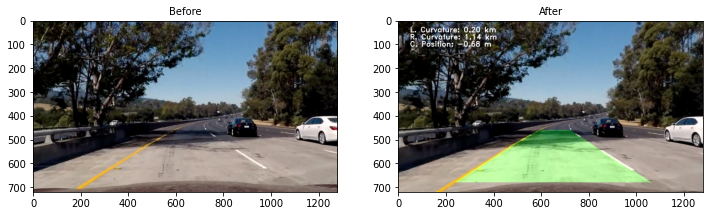

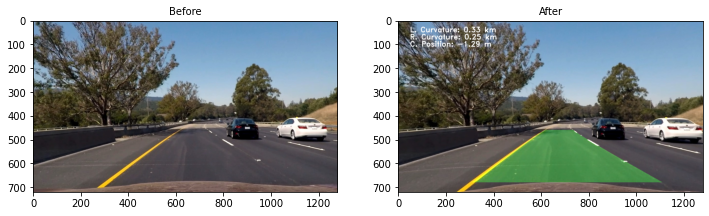

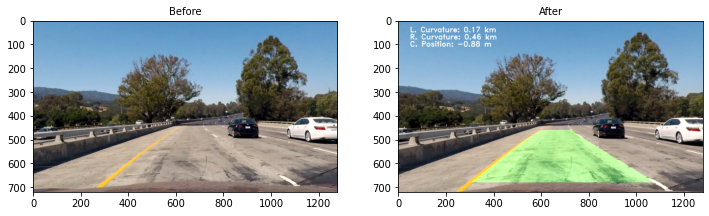

In [24]:
for i in range(len(test_imgs)):
    img = test_imgs[i][1]
    proc = ProcessingPipeline.ProcessingPipeline()
    result = proc.process(img)
    proc.plot_side_by_side(img, result, save=True, fpath='output_images/step6',num=i)

### Testing on video

In [25]:
from moviepy.editor import VideoFileClip

In [26]:
def test_video(inputVideo, outputVideo):
    myclip = VideoFileClip(inputVideo)
    proc = ProcessingPipeline.ProcessingPipeline()

    def pipe(image):
        return proc.process(image)

    clip = myclip.fl_image(pipe)
    clip.write_videofile(outputVideo, audio=False)

    print()

In [27]:
src_p = 'test_vids/project_video.mp4'
dest_p = 'test_vids/out_project_video_2.mp4'

In [28]:
test_video(src_p, dest_p)

t:   0%|          | 2/1260 [00:00<01:23, 15.03it/s, now=None]

Moviepy - Building video test_vids/out_project_video_2.mp4.
Moviepy - Writing video test_vids/out_project_video_2.mp4



Moviepy - Done !
Moviepy - video ready test_vids/out_project_video_2.mp4



In [31]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(dest_p))